In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Libs and methods imports

# Core libs
import pandas as pd
import numpy as np

# DataViz
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

# Hypothesis Testing
from scipy.stats import ttest_ind
from statsmodels.stats.proportion import proportions_ztest

# Machine Learning - Pre-processing, models and metrics
from category_encoders import TargetEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report,
    precision_score, 
    recall_score, 
    f1_score,
    plot_confusion_matrix, 
    plot_roc_curve, 
    plot_precision_recall_curve
)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


pd.set_option('display.max_columns', None)  # Force pandas to show all columns of a dataframe
sns.set(style='whitegrid', rc={'figure.figsize':(9, 6)})  # Graphics default size and style

In [3]:
df_original = pd.read_csv('../data/dataset_v1.csv')

print(df_original.shape)
df_original.head(10)

(682, 18)


,loan_id,loan_date,account_date,loan_amount,loan_duration,account_age_at_loan_months,client_age_at_loan_years,card_type,has_card,district_name_region,district_inhabitants,district_urban_ratio,district_avg_salary,district_unemployment_rate,district_enterpreneurs_per_thousand_inhabitants,district_crimes_per_thousand_inhabitants,loan_salary_ratio,bad_payer
0,4959,1994-01-05,1993-02-26,80952,24,10,48,no card,0,Hl.m. Praha (Prague),1204953,100.0,12541,0.43,167,82.2497,0.268958,0
1,4961,1996-04-29,1995-04-07,30276,12,12,57,no card,0,Tabor (south Bohemia),103347,67.0,9104,2.07,123,22.7776,0.277131,1
2,4962,1997-12-08,1996-07-28,30276,12,16,35,no card,0,Frydek - Mistek (north Moravia),228848,57.2,9893,4.72,96,25.7245,0.255029,0
3,4967,1998-10-14,1997-08-18,318480,60,13,46,no card,0,Strakonice (south Bohemia),70646,58.4,8547,3.64,120,21.8271,0.621037,1
4,4968,1998-04-19,1997-08-08,110736,48,8,58,no card,0,Prachatice (south Bohemia),51428,52.7,8402,3.98,120,21.3697,0.274577,0
5,4973,1996-05-02,1994-10-19,165960,24,18,51,no card,0,Jindrichuv Hradec (south Bohemia),93931,56.9,8427,1.54,107,20.3660,0.820577,0
6,4986,1997-08-10,1996-05-05,102876,12,15,55,no card,0,Ostrava - mesto (north Moravia),323870,100.0,10673,5.44,100,56.6493,0.803242,0
7,4988,1997-12-06,1996-03-10,265320,36,20,30,no card,0,Chrudim (east Bohemia),105606,53.0,8254,3.76,97,22.0158,0.892900,1
8,4989,1998-12-05,1997-07-10,352704,48,16,47,classic,1,Tabor (south Bohemia),103347,67.0,9104,2.07,123,22.7776,0.807118,0
9,4990,1997-09-08,1996-07-17,162576,36,13,44,no card,0,Liberec (north Bohemia),159617,85.2,9198,4.28,131,38.4170,0.490976,0


In [4]:
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 682 entries, 0 to 681
Data columns (total 18 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   loan_id                                          682 non-null    int64  
 1   loan_date                                        682 non-null    object 
 2   account_date                                     682 non-null    object 
 3   loan_amount                                      682 non-null    int64  
 4   loan_duration                                    682 non-null    int64  
 5   account_age_at_loan_months                       682 non-null    int64  
 6   client_age_at_loan_years                         682 non-null    int64  
 7   card_type                                        682 non-null    object 
 8   has_card                                         682 non-null    int64  
 9   district_name_region            

In [5]:
df_original.describe()

,loan_id,loan_amount,loan_duration,account_age_at_loan_months,client_age_at_loan_years,has_card,district_inhabitants,district_urban_ratio,district_avg_salary,district_unemployment_rate,district_enterpreneurs_per_thousand_inhabitants,district_crimes_per_thousand_inhabitants,loan_salary_ratio,bad_payer
count,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,6.820000e+02,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000
mean,6172.466276,151410.175953,36.492669,12.601173,37.630499,0.052786,2.720522e+05,68.212903,9502.986804,3.528431,121.218475,37.177676,0.448010,0.111437
std,682.579279,113372.406310,17.075219,5.414062,12.768289,0.223770,3.583320e+05,20.245469,1323.150982,2.146775,23.366091,19.608415,0.243946,0.314903
min,4959.000000,4980.000000,12.000000,3.000000,13.000000,0.000000,4.282100e+04,33.900000,8110.000000,0.430000,81.000000,15.946100,0.031421,0.000000
25%,5577.500000,66732.000000,24.000000,8.000000,27.000000,0.000000,9.208400e+04,52.000000,8544.000000,1.960000,106.000000,21.827100,0.253275,0.000000
50%,6176.500000,116928.000000,36.000000,12.000000,37.000000,0.000000,1.246050e+05,62.100000,8991.000000,3.490000,116.000000,31.793800,0.415052,0.000000
75%,6752.500000,210654.000000,48.000000,17.000000,48.000000,0.000000,2.261220e+05,87.700000,9897.000000,4.790000,132.000000,43.008700,0.618234,0.000000
max,7308.000000,590820.000000,60.000000,22.000000,61.000000,1.000000,1.204953e+06,100.000000,12541.000000,9.400000,167.000000,82.249700,1.138275,1.000000


In [6]:
df = df_original.set_index('loan_id')

df.head()

,loan_date,account_date,loan_amount,loan_duration,account_age_at_loan_months,client_age_at_loan_years,card_type,has_card,district_name_region,district_inhabitants,district_urban_ratio,district_avg_salary,district_unemployment_rate,district_enterpreneurs_per_thousand_inhabitants,district_crimes_per_thousand_inhabitants,loan_salary_ratio,bad_payer
loan_id,,,,,,,,,,,,,,,,,
4959,1994-01-05,1993-02-26,80952,24,10,48,no card,0,Hl.m. Praha (Prague),1204953,100.0,12541,0.43,167,82.2497,0.268958,0
4961,1996-04-29,1995-04-07,30276,12,12,57,no card,0,Tabor (south Bohemia),103347,67.0,9104,2.07,123,22.7776,0.277131,1
4962,1997-12-08,1996-07-28,30276,12,16,35,no card,0,Frydek - Mistek (north Moravia),228848,57.2,9893,4.72,96,25.7245,0.255029,0
4967,1998-10-14,1997-08-18,318480,60,13,46,no card,0,Strakonice (south Bohemia),70646,58.4,8547,3.64,120,21.8271,0.621037,1
4968,1998-04-19,1997-08-08,110736,48,8,58,no card,0,Prachatice (south Bohemia),51428,52.7,8402,3.98,120,21.3697,0.274577,0


In [7]:
profile = ProfileReport(df.reset_index(drop=True), title="Pandas Profiling Report - PKDD99 Default Prediction")

profile

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
drop_columns = [
    'loan_date',
    'account_date',
    'district_inhabitants',
    'district_crimes_per_thousand_inhabitants'
]

df.drop(columns=drop_columns, inplace=True)

df.head()

,loan_amount,loan_duration,account_age_at_loan_months,client_age_at_loan_years,card_type,has_card,district_name_region,district_urban_ratio,district_avg_salary,district_unemployment_rate,district_enterpreneurs_per_thousand_inhabitants,loan_salary_ratio,bad_payer
loan_id,,,,,,,,,,,,,
4959,80952,24,10,48,no card,0,Hl.m. Praha (Prague),100.0,12541,0.43,167,0.268958,0
4961,30276,12,12,57,no card,0,Tabor (south Bohemia),67.0,9104,2.07,123,0.277131,1
4962,30276,12,16,35,no card,0,Frydek - Mistek (north Moravia),57.2,9893,4.72,96,0.255029,0
4967,318480,60,13,46,no card,0,Strakonice (south Bohemia),58.4,8547,3.64,120,0.621037,1
4968,110736,48,8,58,no card,0,Prachatice (south Bohemia),52.7,8402,3.98,120,0.274577,0


Comparison for loan_amount


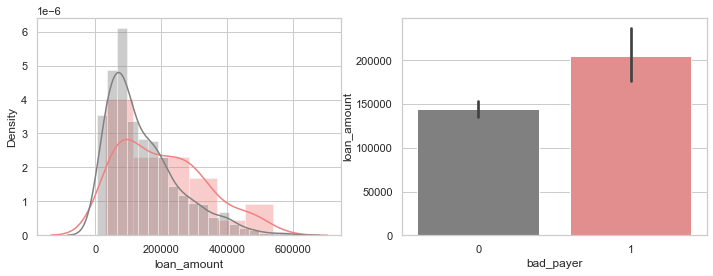

bad_payer
0    144689.089109
1    205002.000000
Name: loan_amount, dtype: float64


P-value for average difference between samples Bad Payer and Good Payer: 0.00022530893589679446


Comparison for loan_duration


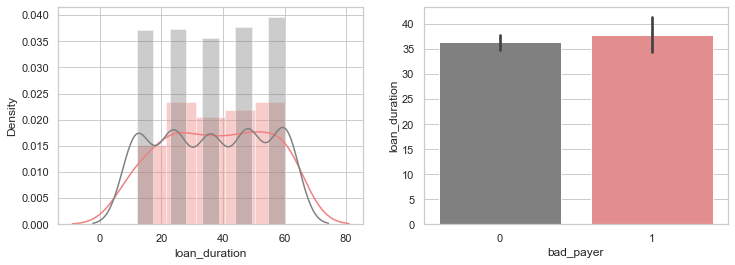

bad_payer
0    36.336634
1    37.736842
Name: loan_duration, dtype: float64


P-value for average difference between samples Bad Payer and Good Payer: 0.49131991643009487


Comparison for loan_salary_ratio


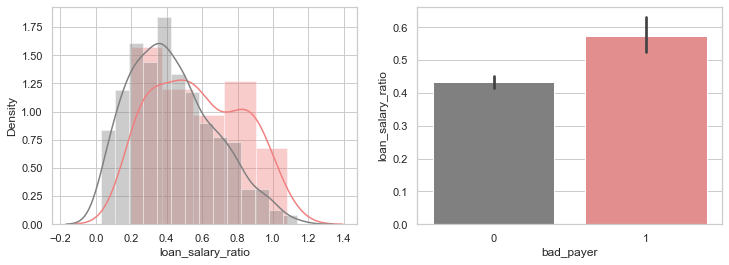

bad_payer
0    0.432127
1    0.574658
Name: loan_salary_ratio, dtype: float64


P-value for average difference between samples Bad Payer and Good Payer: 8.765055440824593e-06


Comparison for account_age_at_loan_months


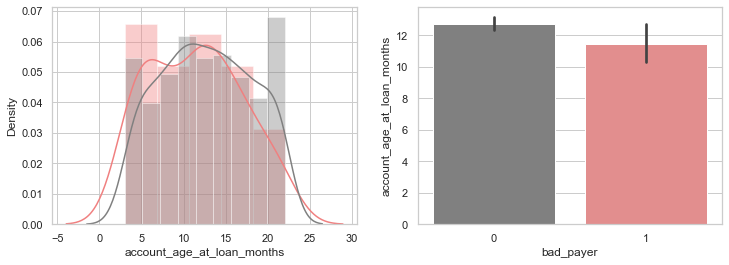

bad_payer
0    12.749175
1    11.421053
Name: account_age_at_loan_months, dtype: float64


P-value for average difference between samples Bad Payer and Good Payer: 0.04936058603346241


Comparison for client_age_at_loan_years


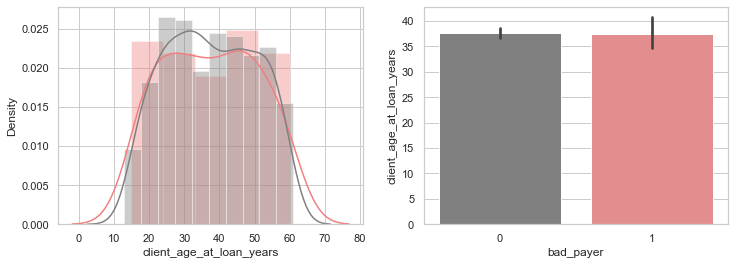

bad_payer
0    37.643564
1    37.526316
Name: client_age_at_loan_years, dtype: float64


P-value for average difference between samples Bad Payer and Good Payer: 0.9423352944424476


Comparison for district_urban_ratio


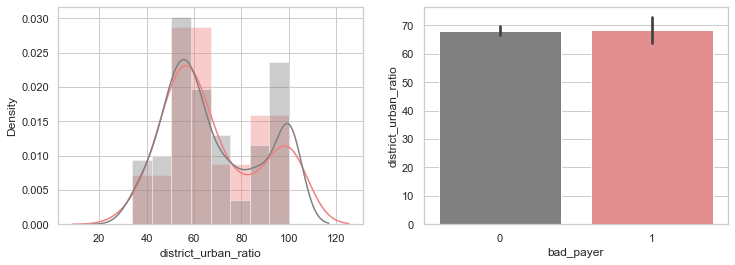

bad_payer
0    68.209901
1    68.236842
Name: district_urban_ratio, dtype: float64


P-value for average difference between samples Bad Payer and Good Payer: 0.9912311035621924


Comparison for district_avg_salary


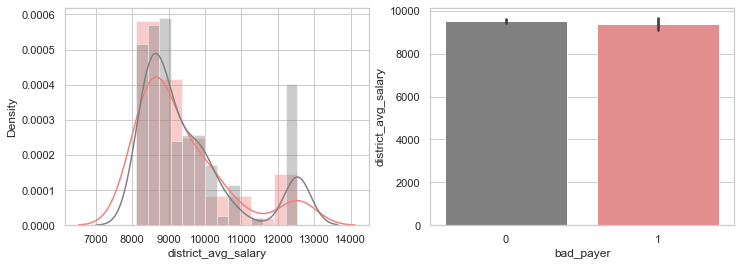

bad_payer
0    9519.166667
1    9373.973684
Name: district_avg_salary, dtype: float64


P-value for average difference between samples Bad Payer and Good Payer: 0.3482008725925967


Comparison for district_unemployment_rate


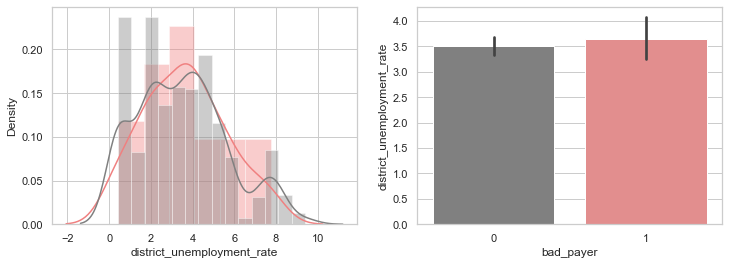

bad_payer
0    3.514703
1    3.637895
Name: district_unemployment_rate, dtype: float64


P-value for average difference between samples Bad Payer and Good Payer: 0.6139394633353796


Comparison for district_enterpreneurs_per_thousand_inhabitants


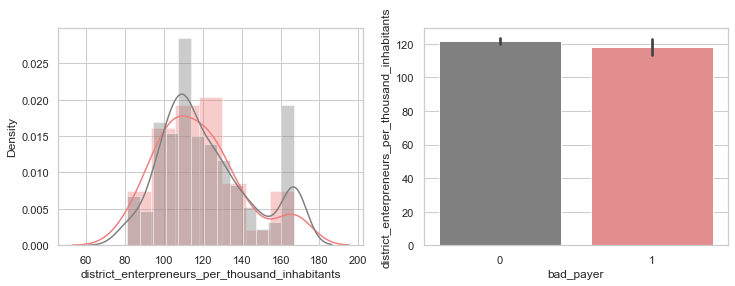

bad_payer
0    121.602310
1    118.157895
Name: district_enterpreneurs_per_thousand_inhabitants, dtype: float64


P-value for average difference between samples Bad Payer and Good Payer: 0.2110540134624708




In [9]:
numerical_columns = [
    'loan_amount',
    'loan_duration',
    'loan_salary_ratio',
    'account_age_at_loan_months',
    'client_age_at_loan_years',
    'district_urban_ratio',
    'district_avg_salary',
    'district_unemployment_rate',
    'district_enterpreneurs_per_thousand_inhabitants'
] 

pvalues_numerical_columns = {
    'variable': numerical_columns,
    'P value': []
}

for numerical_column in numerical_columns:
    print(f'Comparison for {numerical_column}')
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,4))
    sns.distplot(df[df['bad_payer']==1][numerical_column], color='lightcoral', ax=ax1)
    sns.distplot(df[df['bad_payer']==0][numerical_column], color='grey', ax=ax1)
    sns.barplot(data=df, x='bad_payer', y=numerical_column, palette={1: 'lightcoral', 0: 'grey'}, ax=ax2)
    plt.show()

    print(df.groupby(['bad_payer']).mean()[numerical_column])

    t_statistic, pvalue = ttest_ind(
        df[df['bad_payer']==1][numerical_column], 
        df[df['bad_payer']==0][numerical_column],
        equal_var=False  # Not assuming both samples have the same variance
    )
    pvalues_numerical_columns['P value'].append(pvalue)

    print('\n')
    print(f'P-value for average difference between samples Bad Payer and Good Payer: {pvalue}')
    print('\n')

In [10]:
pd.DataFrame(pvalues_numerical_columns).set_index('variable').sort_values('P value')

,P value
variable,
loan_salary_ratio,0.000009
loan_amount,0.000225
account_age_at_loan_months,0.049361
district_enterpreneurs_per_thousand_inhabitants,0.211054
district_avg_salary,0.348201
loan_duration,0.491320
district_unemployment_rate,0.613939
client_age_at_loan_years,0.942335
district_urban_ratio,0.991231


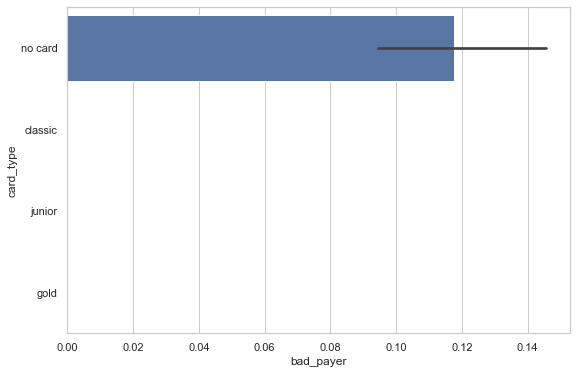

In [11]:
sns.barplot(data=df, x='bad_payer', y='card_type', orient='h')
plt.show()

Compararison for has_card


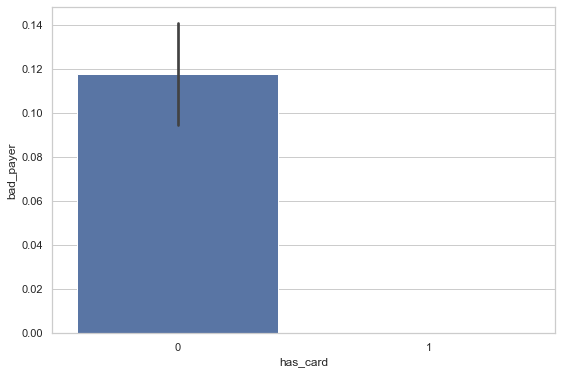

has_card
0    0.117647
1    0.000000
Name: bad_payer, dtype: float64


P-value for proportion difference between bad payer proportion in samples has_card=1 and has_card=0: 0.029019552798991807




In [12]:
print('Compararison for has_card')

sns.barplot(data=df, x='has_card', y='bad_payer')
plt.show()

print(df.groupby('has_card').mean()['bad_payer'])

event_count_a_b = np.array([
    len(df[(df['bad_payer']==1) & (df['has_card']==1)]), 
    len(df[(df['bad_payer']==1) & (df['has_card']==0)])
])

sample_size_a_b = np.array([
    len(df[df['has_card']==1]), 
    len(df[df['has_card']==0])
])

z_statistic, pvalue = proportions_ztest(count=event_count_a_b, nobs=sample_size_a_b)

print('\n')
print(f'P-value for proportion difference between bad payer proportion in samples has_card=1 and has_card=0: {pvalue}')
print('\n')

In [13]:
X_numerical_columns = [
    'loan_amount',
    'loan_salary_ratio',
    'account_age_at_loan_months'
] 

X_boolean_columns = [
    'has_card'
]

X, y = df[X_numerical_columns + X_boolean_columns], df['bad_payer']
print(X.shape)

(682, 4)


<AxesSubplot:>

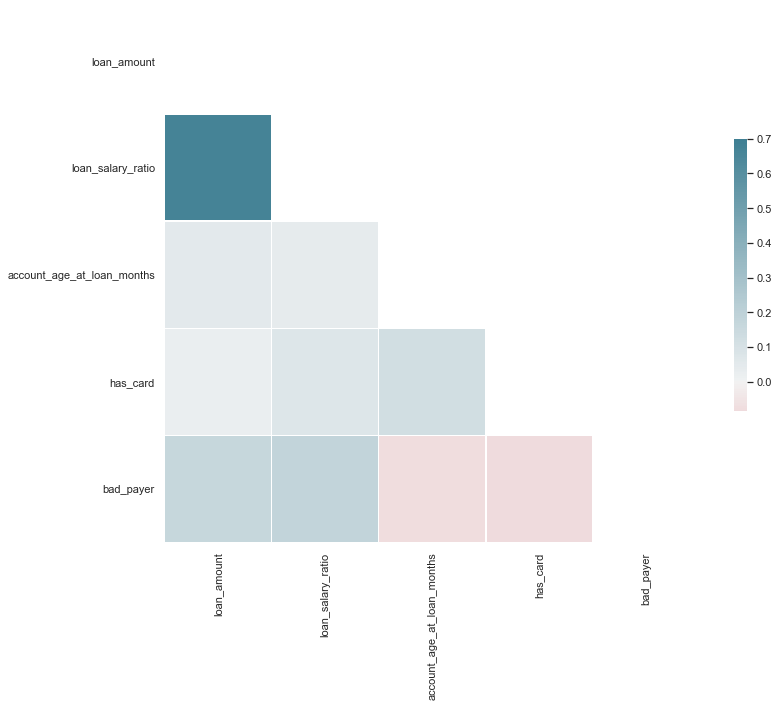

In [14]:
corr = df[X_numerical_columns + X_boolean_columns + ['bad_payer']].corr()

mask = np.triu(np.ones_like(corr, dtype=np.bool))

fig, ax = plt.subplots(figsize=(12, 10))

cmap = sns.diverging_palette(10, 220, as_cmap=True)

sns.heatmap(
    corr,
    mask=mask,
    cmap=cmap,
    vmax=.7,
    center=0,
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": .5}
)

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

print(X_train.shape)

(545, 4)


In [16]:
pd.merge(X[X_numerical_columns], X[X_boolean_columns], left_index=True, right_index=True)

,loan_amount,loan_salary_ratio,account_age_at_loan_months,has_card
loan_id,,,,
4959,80952,0.268958,10,0
4961,30276,0.277131,12,0
4962,30276,0.255029,16,0
4967,318480,0.621037,13,0
4968,110736,0.274577,8,0
...,...,...,...,...
7294,39168,0.164516,11,0
7295,280440,0.472264,20,0
7304,419880,0.558010,5,0


In [17]:
scaler = StandardScaler()

X_train_normalized = scaler.fit_transform(X_train[X_numerical_columns])

X_test_normalized = scaler.transform(X_test[X_numerical_columns])

In [18]:
X_train.loc[:, X_numerical_columns] = X_train_normalized
X_test.loc[:, X_numerical_columns] = X_test_normalized

X_train.head()

,loan_amount,loan_salary_ratio,account_age_at_loan_months,has_card
loan_id,,,,
7067,-0.108288,0.862348,-0.842914,0
4996,-0.538725,1.394779,-1.396838,0
6821,1.558285,0.360215,1.742067,0
7151,-0.131351,0.772254,0.080294,0
5154,-0.356592,-0.943085,1.188142,0


In [19]:
log_regression = LogisticRegression(max_iter=1000, random_state=42, class_weight={0: 1, 1: 5})
forest = RandomForestClassifier(n_estimators=1000, random_state=42, class_weight={0: 1, 1: 5})

In [20]:
log_regression.fit(X_train, y_train)

pd.DataFrame(
    data=log_regression.coef_.T, 
    index=X.columns, 
    columns=['Coeficientes']
).sort_values('Coeficientes', ascending=False)

,Coeficientes
loan_salary_ratio,0.438850
loan_amount,0.083534
account_age_at_loan_months,-0.304511
has_card,-2.214907


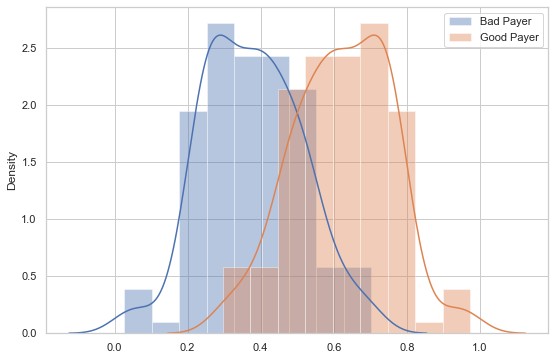

In [21]:
y_pred = log_regression.predict(X_test)

# Distribuição das probabilidades de pertencimento a cada classe
y_pred_probs = log_regression.predict_proba(X_test)
sns.distplot(y_pred_probs[:, 1], label='Bad Payer')
sns.distplot(y_pred_probs[:, 0], label='Good Payer')
plt.legend()
plt.show()

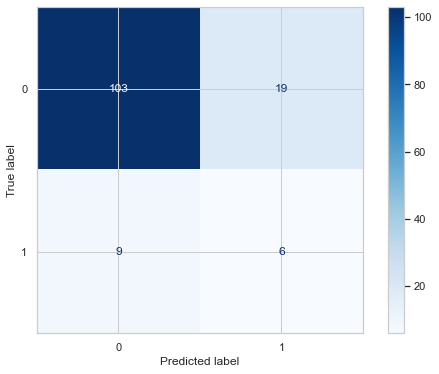

In [22]:
plot_confusion_matrix(log_regression, X_test, y_test, cmap='Blues')
plt.show()

In [23]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.84      0.88       122
           1       0.24      0.40      0.30        15

    accuracy                           0.80       137
   macro avg       0.58      0.62      0.59       137
weighted avg       0.85      0.80      0.82       137



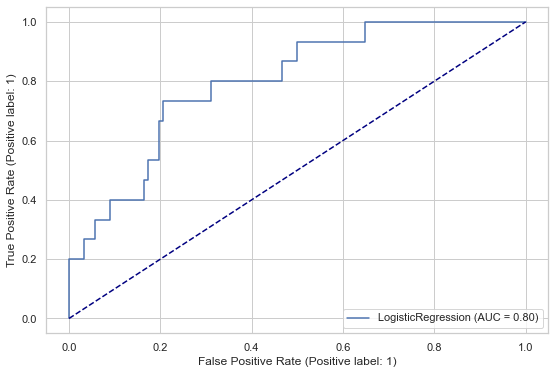

In [24]:
roc_curve_model_1 = plot_roc_curve(log_regression, X_test, y_test)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.show()

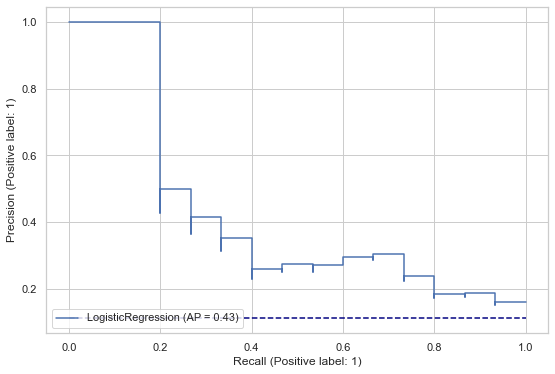

In [25]:
precision_recall_curve_model_1 = plot_precision_recall_curve(log_regression, X_test, y_test)
plt.plot([0,1], [y.mean(), y.mean()], color='navy', linestyle='--')
plt.show()

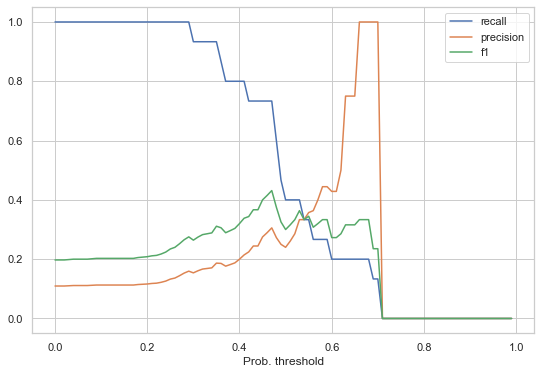

In [26]:
precisions = []
recalls = []
f1s=[]

for i in range(100):
    threshold_prob = i/100
    y_hat = (y_pred_probs[:,1] >= threshold_prob).astype(bool)
    
    precision = precision_score(y_test.values, y_hat)
    recall = recall_score(y_test.values, y_hat)
    f1 = f1_score(y_test.values, y_hat)
    
    precisions.append(precision)
    recalls.append(recall)
    f1s.append(f1)
    
probs = [i/100 for i in range(100)]
sns.lineplot(x=probs, y=recalls, label='recall')
sns.lineplot(x=probs, y=precisions, label='precision')
sns.lineplot(x=probs, y=f1s, label='f1')
plt.xlabel('Prob. threshold')
plt.show()

In [27]:
max_f1_model_1 = max(f1s)
max_f1_threshold_model_1 = f1s.index(max_f1_model_1)
precision_model_1 = precisions[max_f1_threshold_model_1]
recall_model_1 = recalls[max_f1_threshold_model_1]

print(f"Threshold {max_f1_threshold_model_1/100} maximizes f1 score to {max_f1_model_1}")
print(f"In this threshold, precision is {precision_model_1} and recall is {recall_model_1}")

Threshold 0.47 maximizes f1 score to 0.43137254901960786
In this threshold, precision is 0.3055555555555556 and recall is 0.7333333333333333


In [28]:
forest.fit(X_train, y_train)

pd.DataFrame(
    data=forest.feature_importances_.T, 
    index=X.columns, 
    columns=['Feature importance']
).sort_values('Feature importance', ascending=False)

,Feature importance
loan_salary_ratio,0.419049
loan_amount,0.356079
account_age_at_loan_months,0.208211
has_card,0.016661


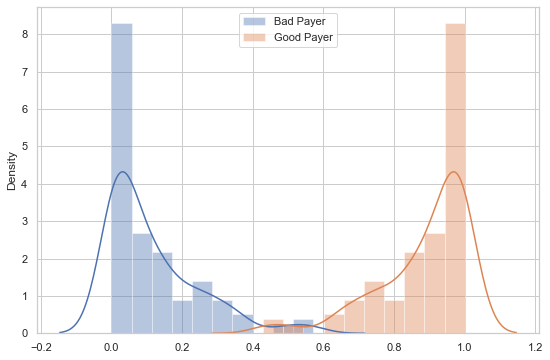

In [29]:
y_pred = forest.predict(X_test)

y_pred_probs = forest.predict_proba(X_test)
sns.distplot(y_pred_probs[:, 1], label='Bad Payer')
sns.distplot(y_pred_probs[:, 0], label='Good Payer')
plt.legend()
plt.show()

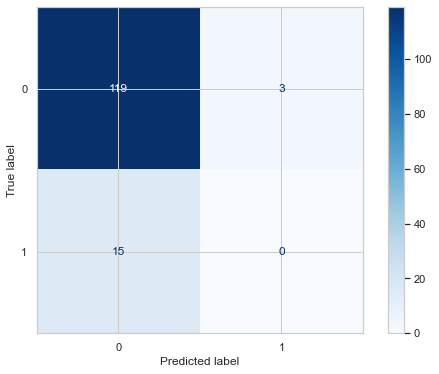

In [30]:
plot_confusion_matrix(forest, X_test, y_test, cmap='Blues')
plt.show()

In [31]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.98      0.93       122
           1       0.00      0.00      0.00        15

    accuracy                           0.87       137
   macro avg       0.44      0.49      0.46       137
weighted avg       0.79      0.87      0.83       137



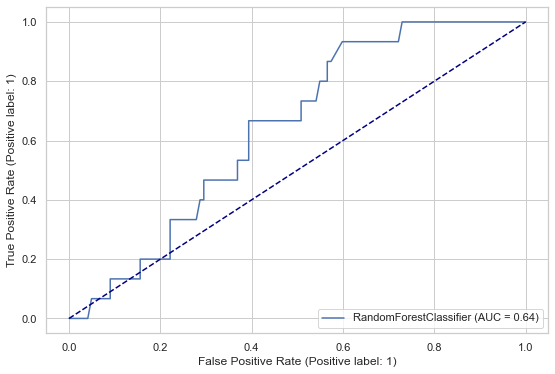

In [32]:
roc_curve_model_2 = plot_roc_curve(forest, X_test, y_test)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.show()

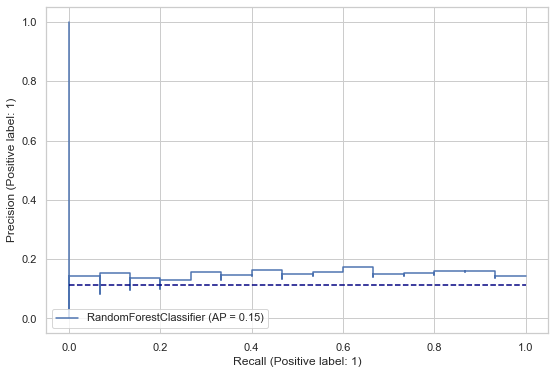

In [33]:
precision_recall_curve_model_2 = plot_precision_recall_curve(forest, X_test, y_test)
plt.plot([0,1], [y.mean(), y.mean()], color='navy', linestyle='--')
plt.show()

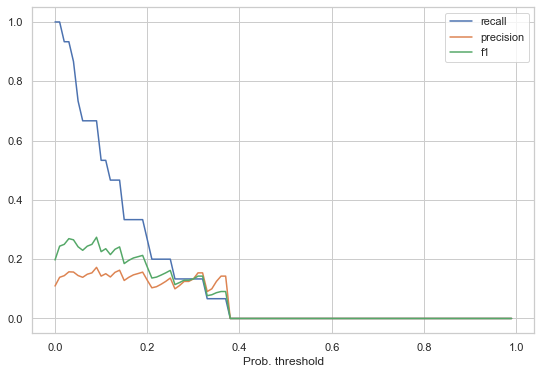

In [34]:
precisions = []
recalls = []
f1s=[]

for i in range(100):
    threshold_prob = i/100
    y_hat = (y_pred_probs[:,1] >= threshold_prob).astype(bool)
    
    precision = precision_score(y_test.values, y_hat)
    recall = recall_score(y_test.values, y_hat)
    f1 = f1_score(y_test.values, y_hat)
    
    precisions.append(precision)
    recalls.append(recall)
    f1s.append(f1)
    
probs = [i/100 for i in range(100)]
sns.lineplot(x=probs, y=recalls, label='recall')
sns.lineplot(x=probs, y=precisions, label='precision')
sns.lineplot(x=probs, y=f1s, label='f1')
plt.xlabel('Prob. threshold')
plt.show()

In [35]:
max_f1_model_2 = max(f1s)
max_f1_threshold_model_2 = f1s.index(max_f1_model_2)
precision_model_2 = precisions[max_f1_threshold_model_2]
recall_model_2 = recalls[max_f1_threshold_model_2]

print(f"Threshold {max_f1_threshold_model_2/100} maximizes f1 score to {max_f1_model_2}")
print(f"In this threshold, precision is {precision_model_2} and recall is {recall_model_2}")

Threshold 0.09 maximizes f1 score to 0.273972602739726
In this threshold, precision is 0.1724137931034483 and recall is 0.6666666666666666


In [36]:
model_comparison = pd.DataFrame({
    "Modelo": [
        "Logistic Regression",
        "Random Forest"
    ],
    "ROC AUC": [
        roc_curve_model_1.roc_auc,
        roc_curve_model_2.roc_auc
    ],
    "Avg Precision": [
        precision_recall_curve_model_1.average_precision,
        precision_recall_curve_model_2.average_precision
    ],
    "Max F1 Score": [
        max_f1_model_1,
        max_f1_model_2
    ],
    "Threshold Max F1 Score": [
        max_f1_threshold_model_1/100,
        max_f1_threshold_model_2/100
    ],
    "Precision in Threshold Max F1 Score": [
        precision_model_1,
        precision_model_2
    ],
    "Recall in Threshold Max F1 Score": [
        recall_model_1,
        recall_model_2
    ]
}, index=[1, 2])

model_comparison

,Modelo,ROC AUC,Avg Precision,Max F1 Score,Threshold Max F1 Score,Precision in Threshold Max F1 Score,Recall in Threshold Max F1 Score
1,Logistic Regression,0.797268,0.429939,0.431373,0.47,0.305556,0.733333
2,Random Forest,0.640164,0.151667,0.273973,0.09,0.172414,0.666667
